## <<<<<<<<<<<<<<<<<< Face Verification >>>>>>>>>>>>>>>>>>>>

## Conditions Before Taking Images

In [1]:
#================Conditions================
#morethan one face in a frame is not allowed
#make sure, your face is visible clearly

## import Required Libraries

In [2]:
#================import Required Libraries=============
import tensorflow as tf
import numpy as np
import facenet
import cv2
import argparse
import time
import glob
from sklearn.metrics import f1_score,recall_score,confusion_matrix as cm,precision_score,accuracy_score
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import scikitplot as skplt

import warnings
warnings.simplefilter("ignore")
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"]="3"
#=============Done importing Libraries=================

ModuleNotFoundError: No module named 'facenet'

## Load Model(Pretrained)

### It is Used to Extract Features from a "Face" Like Edges,etc

In [ ]:
#=========================Load Model===================
#This is a pretrained model.
#This model is used to extract "face Features" from a Given Face
#You can get this model from Below Links
st = time.time()
facenet.load_model("20170512-110547/20170512-110547.pb")
en = time.time()
print('elapsed(model loading): ',en-st)
facenet_model_emb = facenet
#time library for time calculation.
#This model Takes Around "10sec" to load on my SYSTEM(with CPU).
#It May Various in System to System.(may fast load with GPU "I didn't tried yet").

#======================Done Loading Model==============

## Initialize Constants Same as in "Facenet Official Paper"

In [7]:
#===============Initialize Constants as in "Facenet Official Paper"====================
minsize = 20
threshold = [0.6, 0.7, 0.7]
factor = 0.709
margin = 44
input_image_size = 160

sess = tf.Session() #create Tensorflow Session
# Get input and output tensors
images_placeholder = tf.get_default_graph().get_tensor_by_name("input:0")
embeddings = tf.get_default_graph().get_tensor_by_name("embeddings:0")
phase_train_placeholder = tf.get_default_graph().get_tensor_by_name("phase_train:0")
embedding_size = embeddings.get_shape()[1]
threshold = 0.80    # set yourself to meet your requirement
#===============Done with "initializing Constants"====================

## Accuracy Calculation Function

In [8]:
#======================Accuracy Calculation Function=======================
def F(beta, precision, recall):
    return (beta*beta + 1)*precision*recall / (beta*beta*precision + recall)
#======================Done With Calculating Accuracies====================

## Prewhiten the Face IMAGE and Get Embeddings for It

In [9]:
#======================Get Embeddings of a Face====================
def getEmbedding(resized):
    """Generate 128 Embeddings for a image(prewhitened)"""
    reshaped = resized.reshape(-1,input_image_size,input_image_size,3)
    feed_dict = {images_placeholder: reshaped, phase_train_placeholder: False}
    embedding = sess.run(embeddings, feed_dict=feed_dict)
    return embedding
#=====================Embeddings of a Face are Returned=============

#===========image will be prewhitened to detect edges from a image===
def getFace(img):
    """Take image and give this to Facenet.image will be prewhitened to detect edges from a image."""
    faces = []
    #print("i'm here")
    prewhitened = facenet.prewhiten(img)
    faces.append({'face':img,'embedding':getEmbedding(prewhitened)})
    return faces
#=====================Embeddings of a Face are Returned===============


## Calculate Distance Between the Images(Euclidian Distance)

In [10]:
#=====================Calculate Distance Between The FACES(two)============
#Euclidian Distance is used

def compare2face(face1,face2):
    """Compare Two faces of a User"""
    # calculate Euclidean distance
    if face1 and face2: #if face1 and face2 has not empty(both faces are detected)
        dist = np.sqrt(np.sum(np.square(np.subtract(face1[0]['embedding'], face2[0]['embedding']))))
        return dist
    else:   #if photo is not detected from one of the picture(face1 or face2)
        print("photo is not detected.")
        return -1

## Start Here (Main Function Call)

In [11]:
#======================Start "Similarity Check(main)"==============
def similarity_check():
    #0.76,0411
    acc = []
    global l1,l2,actual,pred
    # some constants kept as default from facenet
    path2 = glob.glob('aligned_faces/verify/*')
    path1 = glob.glob("aligned_faces/base_image/*")
    path1.reverse()
    #print(path2)

    for single in path1:
        name = single.split('\\')[-1].split('_')[1].split('.')[0]

        img1 = cv2.imread(single)    #read image(original)
        face1 = getFace(img1)

        w_pred=0
        print("\nMain\ttemp\t\tEuclid\t\tCosine\t\tResult")
        for file in path2:
            img2 = cv2.imread(file)    #read image(test)
            face2 = getFace(img2)
            user_name = file.split('\\')[-1].split('_')[1].split('.')[0]
            #print("user_name: ",user_name)
            #print("name: ",name)
            if(int(user_name[:2]) == int(name)):
                l1.append(0)
            else:
                l1.append(1)
        
            st = time.time()
            c_dist,distance = compare2face(face1,face2) #to get Distance between faces(face1 and face2)
            en = time.time()
            #print("length of username: ",len(user_name))
            #print('elapsed time(comparing): ',en-st)
            if(threshold >= distance):
            	l2.append(0)
            else:
                l2.append(1)
                #print(user_name)
                print(name,"\t\t",user_name,'\t\t',str(distance)[:5]+"\t\t"+str(c_dist[0][0])[:5],'\t',("same person" if distance <= threshold else "not same person"))
        
        print('*****************************************')
        print("user_name: ",name)
        actual.extend(l1)
        pred.extend(l2)
        print("length_l1: ",len(l1),"length_l2: ",len(l2))
        prec = precision_score(l2,l1,average="macro")
        rec  = recall_score(l2,l1,average="macro")
        print("precision_score: ",prec)
        print("recall_score: ",rec)
        print("overall F1_score: ",F(1,prec,rec))
        print("overall F0.5_score: ",F(0.5,prec,rec))
        print("overall F2_score: ",F(2,prec,rec))
        print("total wrong predictions: ",w_pred)
        acc.append(F(2,prec,rec))
        print('*****************************************')
        l1,l2,single_f1 = [],[],[]
        break
    return acc
global actual,pred,l1,l2
actual,pred,l1,l2 = [],[],[],[]

acc = similarity_check()

['validation_dataset/singles\\69.jpg', 'validation_dataset/singles\\56.jpg', 'validation_dataset/singles\\53.jpg', 'validation_dataset/singles\\52.jpg', 'validation_dataset/singles\\50.jpg', 'validation_dataset/singles\\45.jpg', 'validation_dataset/singles\\44.jpg', 'validation_dataset/singles\\40.jpg', 'validation_dataset/singles\\38.jpg', 'validation_dataset/singles\\37.jpg', 'validation_dataset/singles\\36.jpg', 'validation_dataset/singles\\35.jpg', 'validation_dataset/singles\\34.jpg', 'validation_dataset/singles\\32.jpg', 'validation_dataset/singles\\30.jpg', 'validation_dataset/singles\\29.jpg', 'validation_dataset/singles\\27.jpg', 'validation_dataset/singles\\26.jpg', 'validation_dataset/singles\\22.jpg', 'validation_dataset/singles\\21.jpg', 'validation_dataset/singles\\20.jpg', 'validation_dataset/singles\\19.jpg', 'validation_dataset/singles\\17.jpg', 'validation_dataset/singles\\16.jpg', 'validation_dataset/singles\\14.jpg', 'validation_dataset/singles\\13.jpg', 'validation

KeyboardInterrupt: 

## Dataset Visualization (Plots)

## Single Image of Users which are present in "singles" folder

In [7]:
path1 = glob.glob("validation_dataset/singles/*.jpg")
data_path = glob.glob("validation_dataset/test_data/*/*.jpg")
"total size: ",len(path1)*len(data_path)

('total size: ', 17888)

total images in singles folder 32


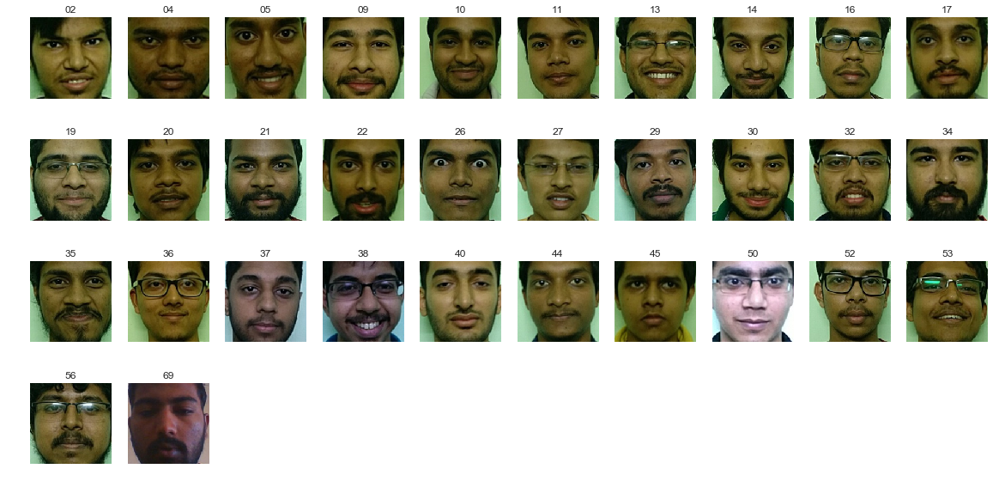

In [124]:
images = glob.glob("validation_dataset/singles/*.jpg")
print("total images in singles folder",len(images))
plt.figure(figsize=(20,10))
for i,image in enumerate(images):
    name = image.split('\\')[-1].split('.')[0]
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    plt.subplot(4,10,i+1)
    plt.axis('off')
    plt.title(name)
    plt.imshow(img)


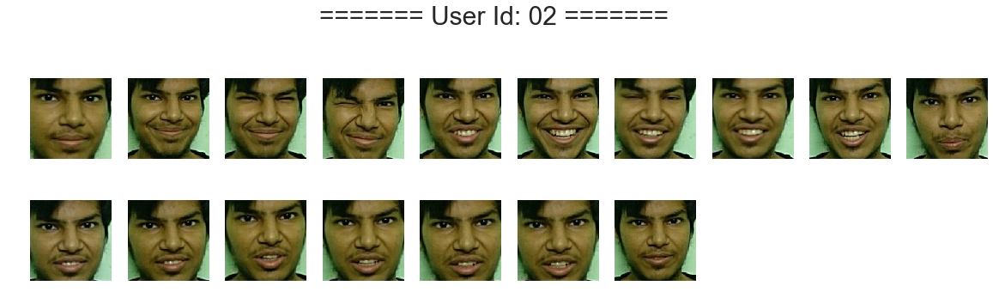

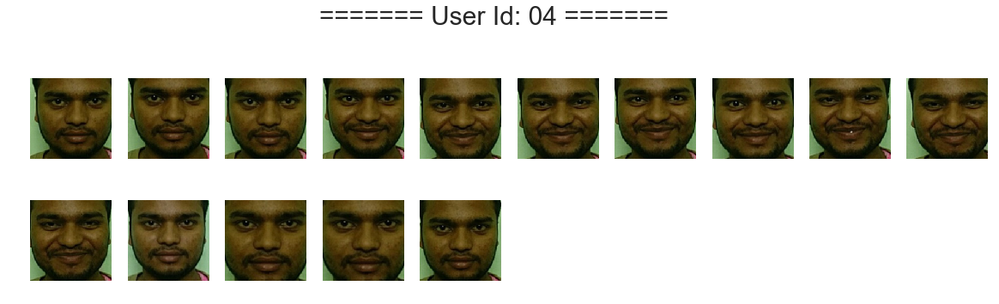

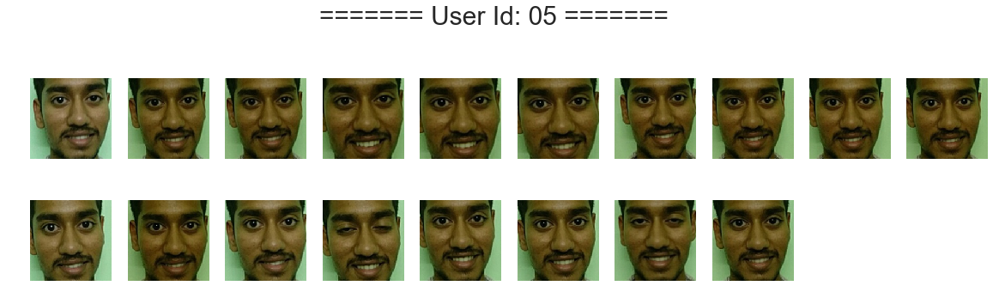

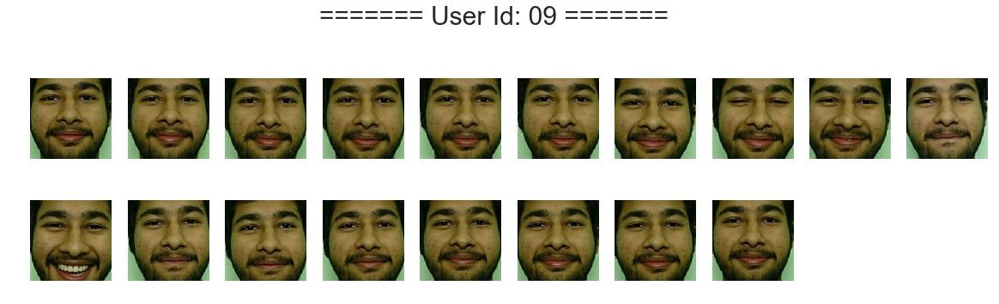

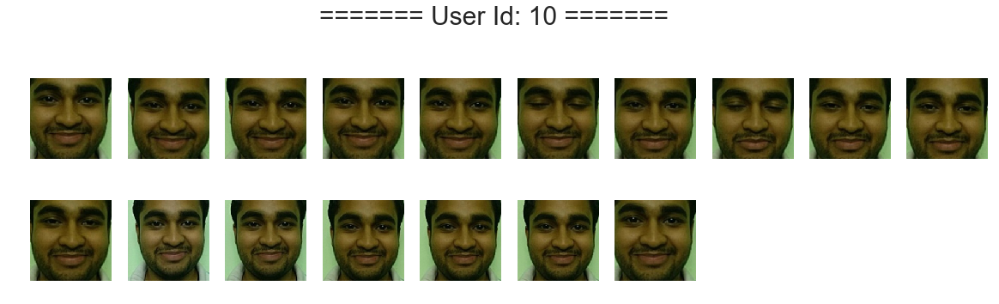

...

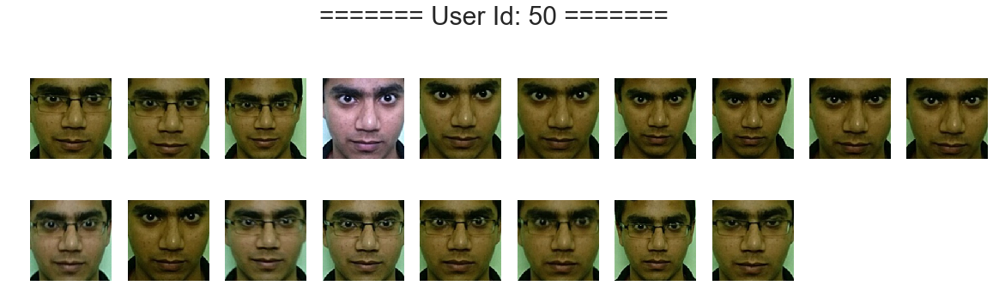

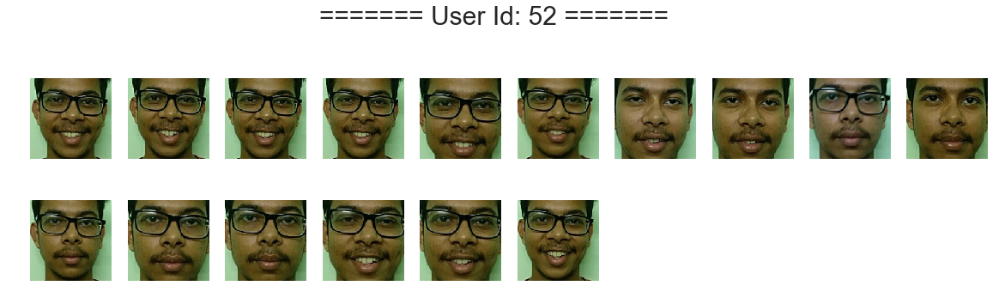

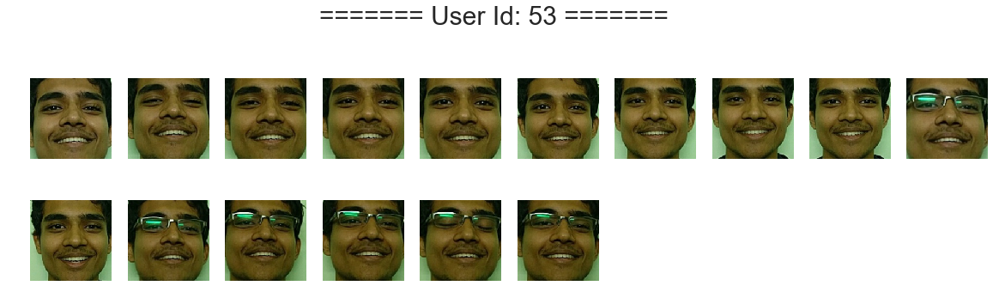

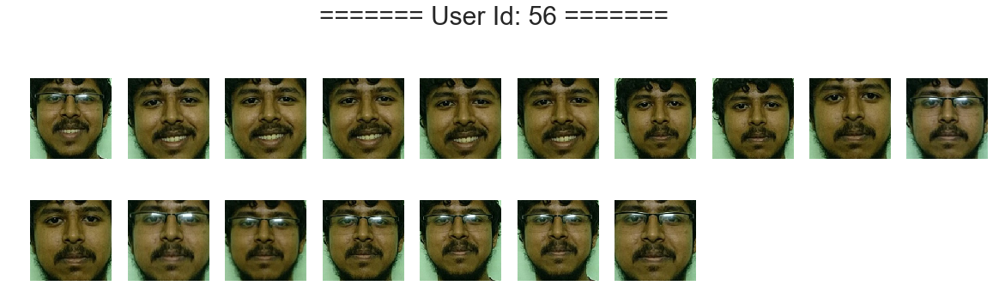

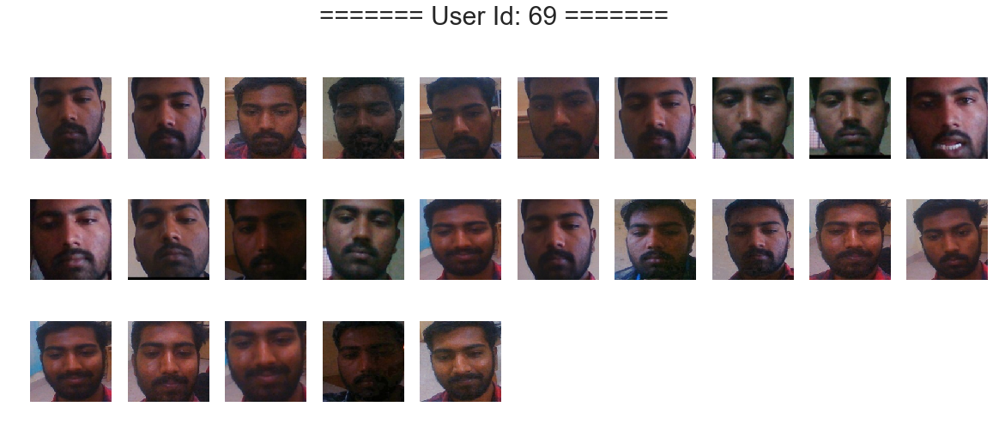

In [140]:
#one image from single folder is tested on each and everyfile in the test_data folder
folders = glob.glob("validation_dataset/test_data/*")
for folder in folders:
    images = glob.glob(folder+"/*")
    
    plt.figure(figsize=(20,10))
    
    #suptitle("")
    for i,image in enumerate(images):
        name = image.split('\\')[-1].split('.')[1]
        img = cv2.imread(image)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        plt.subplot(4,10,i+1)
        plt.axis('off')
        plt.imshow(img)
    plt.suptitle("======= User Id: "+image.split('\\')[-2]+" =======",fontsize=30)
    plt.show()

In [8]:
path1.reverse()
X = []
for p in path1:
    X.append(p.split('\\')[-1].split('.')[0])

In [15]:
acc = acc[0]

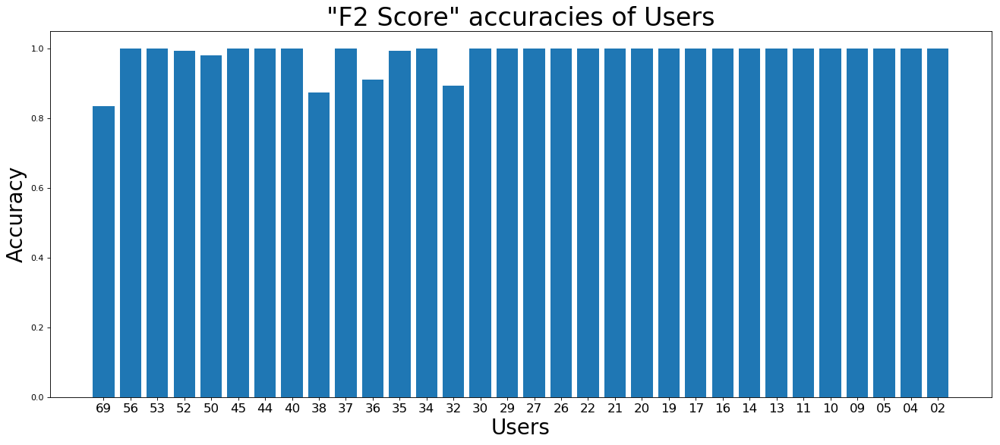

In [16]:
figure(num=None, figsize=(20, 8), dpi=80, facecolor='w', edgecolor='k')
def plot_bar_x():
    # this is for plotting purpose
    index = np.arange(len(acc))
    plt.bar(X, acc)
    plt.xlabel('Users', fontsize=25)
    plt.ylabel('Accuracy', fontsize=25)
    plt.xticks(index, X, fontsize=15, rotation=0)
    plt.title('"F2 Score" accuracies of Users',fontsize=30)
    plt.show()
plot_bar_x()

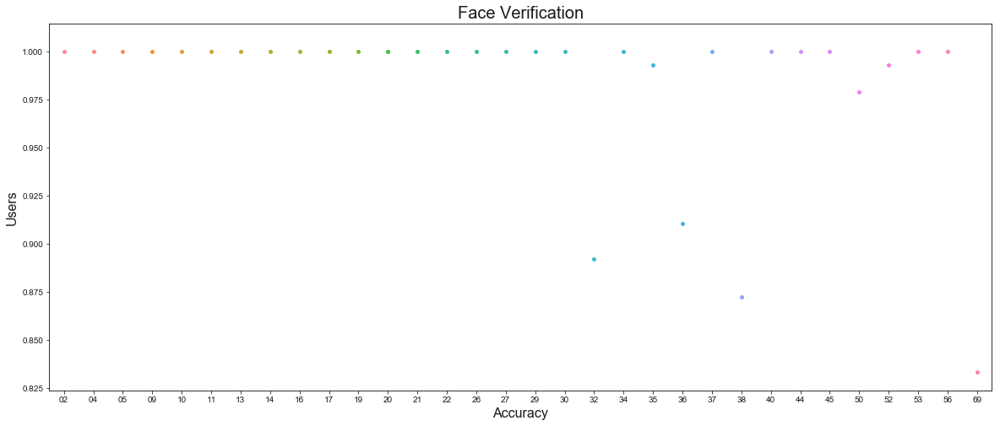

In [17]:
fig, ax = plt.subplots(figsize=(20,8))
sns.set(style ="whitegrid") 
ax = sns.swarmplot(x = X, y = acc,ax=ax)
  
plt.title('Face Verification',fontsize=20) 
plt.xlabel("Accuracy",fontsize=16)
plt.ylabel("Users",fontsize=16)
plt.show() 

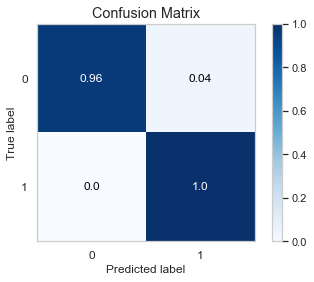

In [18]:
#Confusioin matrix for overall prediction
skplt.metrics.plot_confusion_matrix(pred, actual, normalize=True,title="Confusion Matrix")

Text(0,0.5,'Accuracy')

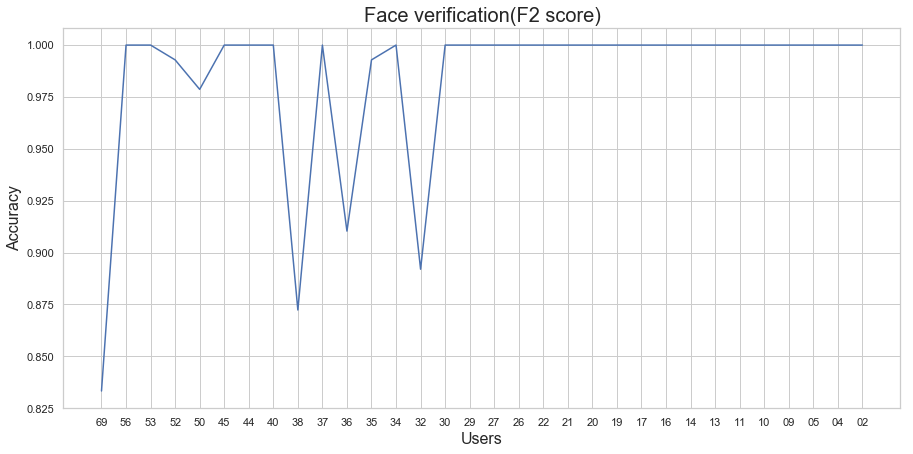

In [20]:
fig,ax = plt.subplots(figsize=(15,7))
plt.plot(X,acc)
plt.title("Face verification(F2 score)",fontsize=20)
plt.xlabel("Users",fontsize=16)
plt.ylabel("Accuracy",fontsize=16)